In [1]:
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import *
from PIL import Image
from torchvision import transforms
import torchvision.transforms.functional as tf
import os
from torch.optim import RMSprop
from torchvision.utils import make_grid
from pylab import plt

In [2]:
#基本配置
path=os.path.abspath('../../dataset/Animals_with_Attributes2/')
path_train=os.path.abspath('../../dataset/GetChu_aligned2/')
num_chann=np.array([64*8,64*4,64*2,64,64])
dnum_chann=np.array([64,64*2,64*4,64*8])
img_size=64
noise_size=100
im_chann=3
bat_size=1
vail_bat=32
tr_epoch=6
worker=1
gpu=True
clamp_num=0.01
learningr=0.005

transform1=transforms.Compose([
    transforms.Resize((img_size,img_size)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3,[0.5]*3)
])

In [3]:
class ZSLdata(Dataset):
    def __init__(self,root,transforms,train_data=True):
        if train_data==True:
            data_selection='train'
            
        else:
            data_selection='test'#测试机读取
            
        #root_label=os.path.abspath('../dataset/Animals_with_Attributes2')
        label_path=[x.path for x in os.scandir(root) if data_selection in x.path]
        word=[]
        for i,file_label in enumerate(label_path):
            f=open(file_label,'r')
            while True:
                temp_w=f.readline().strip()
                if not temp_w:
                    break
                word.append(temp_w)
            f.close()
            
        path_dir=[]
        self.label_list=word
        for key_word in self.label_list:
            [path_dir.append(x.path) for x in os.scandir(root+'/JPEGImages/') if x.name.endswith(key_word)]
                
        pic_path=[]
        for train_root in path_dir:#对训练集文件夹遍历
            [pic_path.append(x.path) for x in os.scandir(train_root) if x.name.endswith(".jpg")]#每个文件夹里的图片地址
        #pic_path=path_dir#图片文件夹目录
        self.images_files=pic_path #图片目录
        self.transforms=transforms
        
    def __getitem__(self,index):
        try:
            pic_data=self.transforms(Image.open(self.images_files[index]))
            
        except RuntimeError:
            print(self.images_files[index])
            return self.transforms(Image.open(self.images_files[index-1]))
            
        else:
            return pic_data
        
        
        #return self.transforms(Image.open(self.images_files[index]))
    
    def __len__(self):
        return len(self.images_files)

In [4]:
class Vaildata(Dataset):
    def __init__(self,root,transform):
        self.image_files=np.array([x.path for x in os.scandir(root) if x.name.endswith(".jpg")])
        self.transform=transform
        #self.augment=augment
        
    def __getitem__(self,index):
        return self.transform(Image.open(self.image_files[index]))
    
    def __len__(self):
        return len(self.image_files)

In [5]:
generator=nn.Sequential(
    nn.ConvTranspose2d(noise_size,num_chann[0],4,1,0,bias=False),
    nn.BatchNorm2d(num_chann[0]),
    nn.ReLU(True),
    
    nn.ConvTranspose2d(num_chann[0],num_chann[1],4,2,1,bias=False),
    nn.BatchNorm2d(num_chann[1]),
    nn.ReLU(True),
    
    nn.ConvTranspose2d(num_chann[1],num_chann[2],4,2,1,bias=False),
    nn.BatchNorm2d(num_chann[2]),
    nn.ReLU(True),
    
    nn.ConvTranspose2d(num_chann[2],num_chann[3],4,2,1,bias=False),
    nn.BatchNorm2d(num_chann[3]),
    nn.ReLU(True),
    
    nn.ConvTranspose2d(num_chann[3],im_chann,4,2,1,bias=False),
    nn.Tanh()

)

discriminator=nn.Sequential(
                             nn.Conv2d(im_chann,dnum_chann[0],4,2,1,bias=False),
                             nn.LeakyReLU(0.2,inplace=True),
                             
                             nn.Conv2d(dnum_chann[0],dnum_chann[1],4,2,1,bias=False),
                             nn.BatchNorm2d(dnum_chann[1]),
                             nn.LeakyReLU(0.2,inplace=True),
                             
                             nn.Conv2d(dnum_chann[1],dnum_chann[2],4,2,1,bias=False),
                             nn.BatchNorm2d(dnum_chann[2]),
                             nn.LeakyReLU(0.2,inplace=True),
                             
                             nn.Conv2d(dnum_chann[2],dnum_chann[3],4,2,1,bias=False),
                             nn.BatchNorm2d(dnum_chann[3]),
                             nn.LeakyReLU(0.2,inplace=True),
                             
                             nn.Conv2d(dnum_chann[3],1,4,1,0,bias=False)
                            )

discriminator.load_state_dict(torch.load('./models/animeGanDisc.pkl'))
generator.load_state_dict(torch.load('./models/animeGanGen.pkl'))

<All keys matched successfully>

In [6]:
dataset=ZSLdata(path,transform1,train_data=False)
#dataset=Vaildata(path_train,transform1)
base_vail_data=Vaildata(path_train,transform1)
test_data=DataLoader(dataset,bat_size)
base_v=DataLoader(base_vail_data,vail_bat)
score_record=np.array([])
discriminator.cuda()
#print(discriminator)
#device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
for i_base,base_data in enumerate(base_v,1):
    for i,data in enumerate(test_data,1):
        base_data_in=base_data.cuda()
        #base_data_in.cuda()
        #base_input=base_data#.cuda()
        #print(base_data_in)
        #base_input.to(device)
        output_base=discriminator(base_data_in).mean().view(1)
        input=data
        input=input.cuda()
        
        output_test=discriminator(input).mean().view(1)
        loss_score=output_base-output_test
        print(loss_score)
        score_record=np.append(score_record,loss_score.cpu().detach().numpy())
        print(score_record)
        
    print(i_base)
    
print(max(score_record))
print(min(score_record))
max_s=np.array([max(score_record)])
min_s=np.array([min(score_record)])
np.savetxt('max_test.txt',max_s)
np.savetxt('min_test.txt',min_s)
np.savetxt('all_score.txt',score_record)

tensor([0.0006], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761]
tensor([0.0049], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877]
tensor([0.0033], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839]
tensor([0.0050], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 0.00504707]
tensor([-0.0030], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839  0.00504707 -0.00303707]
tensor([0.0059], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839  0.00504707 -0.00303707  0.00594989]
tensor([0.0040], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839  0.00504707 -0.00303707  0.00594989
  0.0040084 ]
tensor([0.0031], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839  0.00504707 -0.00303707  0.00594989
  0.0040084   0.00310756]
tensor([-0.0059], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839

tensor([-0.0020], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03]
tensor([-0.0021], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.

tensor([0.0036], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03]
tensor([0.0052], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00

tensor([0.0026], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0008], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([-0.0022], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0042], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0014], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0009], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0003], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0033], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0032], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([-0.0006], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0002], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0043], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0003], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0003], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0022], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0016], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0033], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0048], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-4.0620e-05], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.9571112

tensor([0.0035], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0026], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0010], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0020], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([-0.0045], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([-0.0062], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0082], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0045], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0057], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0014], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0052], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0009], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0002], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0065], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0029], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0024], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([-0.0026], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0029], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0031], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0010], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0037], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0055], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0016], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0013], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([-0.0009], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([-0.0004], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0038], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0032], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0075], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0041], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0003], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0027], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([-0.0052], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0046], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03  3.70766036e-03  2.64546415e-03
  4.60945908e-03  8.40628

tensor([0.0067], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0004], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0034], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0042], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0008], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0031], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03  3.70766036e-03  2.64546415e-03
  4.60945908e-03  8.40628

tensor([0.0035], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0047], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0066], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0025], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0017], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0017], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0025], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0013], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0003], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0058], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0062], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0019], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-4.2968e-05], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.9571112

tensor([0.0016], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0038], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0002], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([-0.0017], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([-0.0017], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03  3.70766036e-03  2.64546415e-03
  4.60945908e-03  8.40628

[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03  3.70766036e-03  2.64546415e-03
  4.60945908e-03  8.40628

tensor([0.0017], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0054], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0093], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0004], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0008], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0031], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0070], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0011], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0050], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03  3.70766036e-03  2.64546415e-03
  4.60945908e-03  8.40628

[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03  3.70766036e-03  2.64546415e-03
  4.60945908e-03  8.40628

tensor([-0.0011], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03  3.70766036e-03  2.64546415e-03
  4.60945908e-03  8.40628

tensor([0.0047], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0034], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0059], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([-0.0039], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03  3.70766036e-03  2.64546415e-03
  4.60945908e-03  8.40628

tensor([0.0068], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0041], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0003], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0058], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0022], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0030], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0056], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([-0.0004], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([-0.0006], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0035], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0040], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03  3.70766036e-03  2.64546415e-03
  4.60945908e-03  8.40628

tensor([-0.0008], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0032], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0003], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03  3.70766036e-03  2.64546415e-03
  4.60945908e-03  8.40628

[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03  3.70766036e-03  2.64546415e-03
  4.60945908e-03  8.40628

tensor([-0.0004], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03  3.70766036e-03  2.64546415e-03
  4.60945908e-03  8.40628

tensor([0.0016], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03  3.70766036e-03  2.64546415e-03
  4.60945908e-03  8.40628

tensor([0.0040], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0011], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0006], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0045], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0043], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0037], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0030], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03  3.70766036e-03  2.64546415e-03
  4.60945908e-03  8.40628

[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03  3.70766036e-03  2.64546415e-03
  4.60945908e-03  8.40628

tensor([0.0028], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0021], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([-0.0004], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0014], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0033], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0018], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0053], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0044], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0004], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0058], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([-0.0019], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0007], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-8.5542e-06], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.9571112

tensor([0.0004], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0027], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0018], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0012], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0036], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0027], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0084], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0026], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0004], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03  3.70766036e-03  2.64546415e-03
  4.60945908e-03  8.40628

tensor([-0.0002], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0025], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0003], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0057], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0010], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0039], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0008], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0013], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0042], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0001], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0037], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03  3.70766036e-03  2.64546415e-03
  4.60945908e-03  8.40628

tensor([0.0030], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([0.0005], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-0.0016], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-0

tensor([0.0051], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.95711122e-03

tensor([-2.5827e-05], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03  5.04707079e-03
 -3.03706713e-03  5.94988838e-03  4.00839513e-03  3.10756243e-03
 -5.87510969e-03 -1.40578393e-03  7.10341288e-03 -1.29592139e-03
  5.28326165e-03  4.21792641e-03  9.36924480e-04 -5.86279109e-03
  3.82802915e-04 -2.00328138e-03  2.19933409e-03 -4.87052370e-03
  3.97414295e-03  2.99922028e-03 -3.83988954e-03  3.02013243e-03
 -2.02902593e-04 -1.41421240e-03 -1.01746991e-05  4.87291301e-03
  3.74586065e-03  1.63467601e-03 -3.71205062e-03  1.50010502e-03
  8.30781180e-04  2.90496880e-03 -1.49393175e-03 -1.97821110e-03
 -2.07573362e-03 -1.07654836e-04  2.99049402e-03 -4.34339978e-03
  4.55386704e-03  1.39842741e-03  1.73308235e-03  4.95219324e-03
  5.34266792e-03  3.03878053e-03  3.63192055e-03  3.55125219e-03
  5.17029129e-03  4.27346397e-03 -2.92045809e-03 -8.43956601e-04
  8.23255163e-04  1.38285430e-03 -1.66616403e-04  6.22836407e-03
 -1.41832046e-03 -2.9571112

tensor([0.0016], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03 ... -1.02462713e-04
 -7.37472437e-05  1.58190588e-03]
tensor([0.0021], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03 ... -7.37472437e-05
  1.58190588e-03  2.09308555e-03]
tensor([-0.0018], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00158191  0.00209309
 -0.00175044]
tensor([0.0028], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00209309 -0.00175044
  0.00275076]
tensor([-0.0005], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00175044  0.00275076
 -0.00052729]
tensor([-0.0006], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00275076 -0.00052729
 -0.00059733]
tensor([0.0037], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00052729 -0.00059733
  0.

tensor([0.0031], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00015926 0.00377881 0.0031223 ]
tensor([0.0021], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00377881 0.0031223  0.00210868]
tensor([-0.0013], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.0031223   0.00210868
 -0.00130326]
tensor([0.0023], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00210868 -0.00130326
  0.00233365]
tensor([-0.0004], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00130326  0.00233365
 -0.00044012]
tensor([0.0026], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00233365 -0.00044012
  0.00257703]
tensor([-0.0004], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00044012  0.00257703
 -0.00040599]
tensor([0.0053], device='cuda:0', grad_fn=<SubBackwa

tensor([0.0013], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00113215 0.00460418 0.0012848 ]
tensor([0.0023], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00460418 0.0012848  0.00230855]
tensor([0.0047], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.0012848  0.00230855 0.00465985]
tensor([0.0028], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00230855 0.00465985 0.0028203 ]
tensor([-0.0034], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00465985  0.0028203
 -0.00337748]
tensor([0.0008], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.0028203  -0.00337748
  0.00077433]
tensor([0.0027], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00337748  0.00077433
  0.00271028]
tensor([0.0004], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761

tensor([0.0020], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.0025786  -0.00016201
  0.0020257 ]
tensor([-0.0002], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00016201  0.0020257
 -0.00015466]
tensor([0.0006], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.0020257  -0.00015466
  0.00061635]
tensor([0.0033], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00015466  0.00061635
  0.00325731]
tensor([0.0009], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00061635 0.00325731 0.00090831]
tensor([0.0042], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00325731 0.00090831 0.00424695]
tensor([-0.0028], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00090831  0.00424695
 -0.00282739]
tensor([0.0044], device='cuda:0', grad_fn=<SubBackward

tensor([0.0030], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00501651  0.00044268
  0.00298729]
tensor([0.0046], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00044268 0.00298729 0.00461165]
tensor([-0.0069], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00298729  0.00461165
 -0.00686096]
tensor([-0.0010], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00461165 -0.00686096
 -0.0009717 ]
tensor([-0.0013], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00686096 -0.0009717
 -0.00125708]
tensor([0.0029], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.0009717  -0.00125708
  0.00293736]
tensor([0.0027], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00125708  0.00293736
  0.00270006]
tensor([-0.0030], device='cuda:0', grad_fn=<Su

[ 0.00057761  0.00488877  0.00326839 ... -0.00137875 -0.00383999
  0.00385668]
tensor([-0.0022], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00383999  0.00385668
 -0.00223454]
tensor([0.0080], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00385668 -0.00223454
  0.00800841]
tensor([0.0031], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00223454  0.00800841
  0.00308643]
tensor([0.0005], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00800841 0.00308643 0.00047973]
tensor([0.0010], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00308643 0.00047973 0.0010155 ]
tensor([0.0032], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00047973 0.0010155  0.00318397]
tensor([-0.0047], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.0010155   0.0031

tensor([0.0011], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00163727 0.00319534 0.00106556]
tensor([0.0009], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00319534 0.00106556 0.00092213]
tensor([-0.0021], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00106556  0.00092213
 -0.00211044]
tensor([-0.0019], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00092213 -0.00211044
 -0.0018751 ]
tensor([0.0008], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00211044 -0.0018751
  0.00081687]
tensor([-0.0015], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.0018751   0.00081687
 -0.00153083]
tensor([-0.0021], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00081687 -0.00153083
 -0.00205596]
tensor([-0.0035], device='cuda:0', grad_fn=<SubBackw

tensor([-0.0024], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00155378  0.00317763
 -0.0023729 ]
tensor([0.0049], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00317763 -0.0023729
  0.00491716]
tensor([-0.0037], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.0023729   0.00491716
 -0.00367524]
tensor([-0.0018], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00491716 -0.00367524
 -0.00175373]
tensor([0.0040], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00367524 -0.00175373
  0.00401749]
tensor([-0.0009], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00175373  0.00401749
 -0.00093001]
tensor([0.0035], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00401749 -0.00093001
  0.00347678]
tensor([-0.0029], device='cuda:0', gra

tensor([-0.0010], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00240177  0.00368143
 -0.00101558]
tensor([0.0067], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00368143 -0.00101558
  0.00670582]
tensor([-0.0002], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00101558  0.00670582
 -0.0001667 ]
tensor([0.0021], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00670582 -0.0001667
  0.00207259]
tensor([0.0021], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.0001667   0.00207259
  0.00213711]
tensor([0.0014], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00207259 0.00213711 0.00140728]
tensor([0.0011], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00213711 0.00140728 0.00111622]
tensor([0.0053], device='cuda:0', grad_fn=<SubBackward

tensor([-0.0007], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00152391  0.00087115
 -0.0007311 ]
tensor([-0.0013], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00087115 -0.0007311
 -0.0013375 ]
tensor([0.0009], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.0007311  -0.0013375
  0.00088421]
tensor([0.0008], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.0013375   0.00088421
  0.00078582]
tensor([-0.0038], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00088421  0.00078582
 -0.00377757]
tensor([-0.0003], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00078582 -0.00377757
 -0.00032675]
tensor([-0.0021], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00377757 -0.00032675
 -0.00207886]
tensor([-0.0044], device='cuda:0', gra

tensor([0.0015], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.0008918  0.00649209 0.00153501]
tensor([0.0051], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00649209 0.00153501 0.00511625]
tensor([0.0018], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00153501 0.00511625 0.00184686]
tensor([-0.0007], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00511625  0.00184686
 -0.00065498]
tensor([0.0034], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00184686 -0.00065498
  0.00341751]
tensor([0.0034], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00065498  0.00341751
  0.0033559 ]
tensor([0.0053], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00341751 0.0033559  0.00533201]
tensor([-0.0009], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057

tensor([0.0036], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.0019034  0.00852797 0.00356604]
tensor([0.0022], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00852797 0.00356604 0.00220784]
tensor([0.0071], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00356604 0.00220784 0.00708296]
tensor([0.0017], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00220784 0.00708296 0.00168012]
tensor([-0.0011], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00708296  0.00168012
 -0.00113257]
tensor([0.0019], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00168012 -0.00113257
  0.00190924]
tensor([0.0073], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00113257  0.00190924
  0.00729151]
tensor([0.0038], device='cuda:0', grad_fn=<SubBackward0>)
[0.0005776

tensor([0.0020], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.000591   -0.00568948
  0.00197967]
tensor([0.0057], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00568948  0.00197967
  0.00574386]
tensor([0.0044], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00197967 0.00574386 0.00436032]
tensor([0.0049], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00574386 0.00436032 0.0048657 ]
tensor([0.0024], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00436032 0.0048657  0.00242529]
tensor([0.0013], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.0048657  0.00242529 0.00125294]
tensor([-0.0029], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00242529  0.00125294
 -0.00289315]
tensor([0.0060], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.000577

tensor([-0.0018], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00209983  0.00078589
 -0.00177071]
tensor([-0.0027], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00078589 -0.00177071
 -0.00266854]
tensor([-4.4614e-05], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03 ... -1.77071337e-03
 -2.66853906e-03 -4.46140766e-05]
tensor([0.0049], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03 ... -2.66853906e-03
 -4.46140766e-05  4.88394219e-03]
tensor([-0.0014], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03 ... -4.46140766e-05
  4.88394219e-03 -1.38202868e-03]
tensor([0.0028], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00488394 -0.00138203
  0.00277852]
tensor([0.0053], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...

tensor([-0.0006], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00380502 -0.00437757
 -0.00064856]
tensor([-0.0050], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00437757 -0.00064856
 -0.00495781]
tensor([0.0029], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00064856 -0.00495781
  0.00291822]
tensor([0.0098], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00495781  0.00291822
  0.0097728 ]
tensor([0.0025], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00291822 0.0097728  0.0025416 ]
tensor([-0.0006], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.0097728   0.0025416
 -0.0006268 ]
tensor([0.0007], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.0025416  -0.0006268
  0.0006673 ]
tensor([0.0038], device='cuda:0', grad_fn=<SubB

tensor([-0.0053], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.0004304  -0.00076184
 -0.00533482]
tensor([0.0065], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00076184 -0.00533482
  0.00646237]
tensor([0.0007], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00533482  0.00646237
  0.00068758]
tensor([0.0037], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00646237 0.00068758 0.00370561]
tensor([0.0030], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00068758 0.00370561 0.00303278]
tensor([-0.0015], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00370561  0.00303278
 -0.00153103]
tensor([0.0030], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00303278 -0.00153103
  0.00303419]
tensor([0.0004], device='cuda:0', grad_fn=<SubBackwar

tensor([0.0060], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00487443 -0.00024613
  0.00595165]
tensor([0.0031], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00024613  0.00595165
  0.00305845]
tensor([0.0005], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00595165 0.00305845 0.00050886]
tensor([0.0042], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00305845 0.00050886 0.00424301]
tensor([0.0058], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00050886 0.00424301 0.00576067]
tensor([0.0031], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00424301 0.00576067 0.00309655]
tensor([0.0062], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00576067 0.00309655 0.00619874]
tensor([-0.0023], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.0

tensor([0.0016], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00585582 -0.00030878
  0.00158224]
tensor([-0.0044], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00030878  0.00158224
 -0.00444171]
tensor([0.0046], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00158224 -0.00444171
  0.00458538]
tensor([0.0056], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00444171  0.00458538
  0.00563947]
tensor([0.0103], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00458538 0.00563947 0.01034764]
tensor([0.0072], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00563947 0.01034764 0.00724369]
tensor([-0.0059], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.01034764  0.00724369
 -0.00590725]
tensor([5.1391e-05], device='cuda:0', grad_fn=<SubBac

tensor([0.0043], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00319411  0.00865751
  0.00427767]
tensor([0.0042], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00865751 0.00427767 0.00423455]
tensor([0.0024], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00427767 0.00423455 0.00242945]
tensor([0.0014], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00423455 0.00242945 0.00139428]
tensor([-0.0048], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00242945  0.00139428
 -0.00480993]
tensor([0.0010], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00139428 -0.00480993
  0.00103854]
tensor([0.0056], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00480993  0.00103854
  0.0056233 ]
tensor([0.0046], device='cuda:0', grad_fn=<SubBackward0>)
[0.

tensor([0.0045], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03 ...  7.25590112e-03
 -4.12235968e-05  4.52870177e-03]
tensor([0.0061], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03 ... -4.12235968e-05
  4.52870177e-03  6.13090862e-03]
tensor([0.0096], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.0045287  0.00613091 0.00963839]
tensor([0.0014], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00613091 0.00963839 0.00139899]
tensor([0.0057], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00963839 0.00139899 0.00566024]
tensor([0.0004], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00139899 0.00566024 0.00044778]
tensor([0.0074], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00566024 0.00044778 0.00736668]
tensor([0.0015], device='cud

tensor([-0.0002], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00732914  0.00451705
 -0.00024908]
tensor([0.0042], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00451705 -0.00024908
  0.00422493]
tensor([0.0012], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00024908  0.00422493
  0.00118075]
tensor([0.0005], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00422493 0.00118075 0.0004688 ]
tensor([0.0022], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00118075 0.0004688  0.00215028]
tensor([0.0020], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.0004688  0.00215028 0.00196108]
tensor([-0.0036], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00215028  0.00196108
 -0.00357795]
tensor([0.0082], device='cuda:0', grad_fn=<SubBackward0>)
[ 

tensor([0.0048], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00389597 -0.00557175
  0.00478586]
tensor([0.0066], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00557175  0.00478586
  0.00661058]
tensor([0.0009], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00478586 0.00661058 0.00088224]
tensor([-0.0039], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00661058  0.00088224
 -0.00387159]
tensor([0.0040], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00088224 -0.00387159
  0.00401698]
tensor([0.0017], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00387159  0.00401698
  0.00167463]
tensor([-0.0068], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00401698  0.00167463
 -0.00679135]
tensor([0.0009], device='cuda:0', grad_fn=<Sub

tensor([-0.0010], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00241485  0.00127043
 -0.00095965]
tensor([-0.0012], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00127043 -0.00095965
 -0.00122045]
tensor([0.0044], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00095965 -0.00122045
  0.00437989]
tensor([0.0018], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00122045  0.00437989
  0.00176013]
tensor([0.0041], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00437989 0.00176013 0.00413861]
tensor([0.0028], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00176013 0.00413861 0.00277431]
tensor([0.0047], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00413861 0.00277431 0.00474082]
tensor([0.0057], device='cuda:0', grad_fn=<SubBackward0>)
[0

tensor([0.0057], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00806376 0.00748608 0.00567978]
tensor([0.0026], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00748608 0.00567978 0.00263366]
tensor([-0.0002], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00567978  0.00263366
 -0.00019479]
tensor([0.0054], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00263366 -0.00019479
  0.0054481 ]
tensor([0.0076], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00019479  0.0054481
  0.00760772]
tensor([0.0038], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.0054481  0.00760772 0.00378104]
tensor([0.0023], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00760772 0.00378104 0.00227134]
tensor([0.0021], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761

tensor([0.0030], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00370365 -0.00400617
  0.00298853]
tensor([0.0053], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00400617  0.00298853
  0.00526732]
tensor([-0.0052], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00298853  0.00526732
 -0.00524666]
tensor([0.0082], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00526732 -0.00524666
  0.00823584]
tensor([-0.0006], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00524666  0.00823584
 -0.00055217]
tensor([0.0040], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00823584 -0.00055217
  0.00399785]
tensor([0.0023], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00055217  0.00399785
  0.002319  ]
tensor([0.0025], device='cuda:0', grad_

tensor([0.0038], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00362195  0.00570505
  0.00378775]
tensor([-0.0006], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00570505  0.00378775
 -0.0006353 ]
tensor([0.0063], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00378775 -0.0006353
  0.00627774]
tensor([0.0020], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.0006353   0.00627774
  0.00195573]
tensor([0.0068], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00627774 0.00195573 0.00682925]
tensor([0.0002], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00195573 0.00682925 0.00020147]
tensor([0.0045], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00682925 0.00020147 0.00452136]
tensor([0.0025], device='cuda:0', grad_fn=<SubBackward0>)
[0.0

tensor([0.0048], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00355614 0.00330424 0.00478808]
tensor([1.8367e-05], device='cuda:0', grad_fn=<SubBackward0>)
[5.77608589e-04 4.88876877e-03 3.26839252e-03 ... 3.30424239e-03
 4.78807651e-03 1.83666125e-05]
tensor([-0.0051], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03 ...  4.78807651e-03
  1.83666125e-05 -5.13398182e-03]
tensor([-0.0060], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03 ...  1.83666125e-05
 -5.13398182e-03 -5.98080456e-03]
tensor([0.0067], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00513398 -0.0059808
  0.00671272]
tensor([0.0038], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.0059808   0.00671272
  0.00375404]
tensor([0.0056], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00671272 0.00375

tensor([8.6986e-06], device='cuda:0', grad_fn=<SubBackward0>)
[5.77608589e-04 4.88876877e-03 3.26839252e-03 ... 4.20053769e-03
 1.95716647e-03 8.69855285e-06]
tensor([0.0083], device='cuda:0', grad_fn=<SubBackward0>)
[5.77608589e-04 4.88876877e-03 3.26839252e-03 ... 1.95716647e-03
 8.69855285e-06 8.30696896e-03]
tensor([-0.0063], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03 ...  8.69855285e-06
  8.30696896e-03 -6.25901762e-03]
tensor([0.0031], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00830697 -0.00625902
  0.00313515]
tensor([0.0068], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00625902  0.00313515
  0.0067513 ]
tensor([0.0091], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00313515 0.0067513  0.00907111]
tensor([0.0040], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.0067513  0.00907111 0.

tensor([0.0027], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00111655 0.0062626  0.00274903]
tensor([0.0083], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.0062626  0.00274903 0.00833032]
tensor([0.0038], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00274903 0.00833032 0.00379686]
tensor([0.0064], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00833032 0.00379686 0.00640111]
tensor([0.0020], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00379686 0.00640111 0.00199112]
tensor([0.0070], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00640111 0.00199112 0.00700602]
tensor([0.0067], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00199112 0.00700602 0.00666262]
tensor([0.0053], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.0032683

tensor([0.0069], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00534525 0.00590499 0.00694026]
tensor([0.0056], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00590499 0.00694026 0.00562175]
tensor([0.0018], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00694026 0.00562175 0.00183536]
tensor([-6.7428e-05], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03 ...  5.62175130e-03
  1.83535600e-03 -6.74282201e-05]
tensor([0.0020], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03 ...  1.83535600e-03
 -6.74282201e-05  2.02115439e-03]
tensor([0.0035], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03 ... -6.74282201e-05
  2.02115439e-03  3.52023449e-03]
tensor([0.0048], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00202115 0.00352023 0.00

tensor([-0.0013], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00176932  0.00652476
 -0.00126631]
tensor([0.0012], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00652476 -0.00126631
  0.0012409 ]
tensor([0.0060], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00126631  0.0012409
  0.00597578]
tensor([0.0058], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.0012409  0.00597578 0.00581696]
tensor([-0.0008], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00597578  0.00581696
 -0.00082534]
tensor([0.0038], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00581696 -0.00082534
  0.00377271]
tensor([-0.0030], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00082534  0.00377271
 -0.00297496]
tensor([0.0050], device='cuda:0', grad_fn=<Sub

tensor([0.0058], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00392065 -0.00326931
  0.00582591]
tensor([0.0035], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00326931  0.00582591
  0.00348511]
tensor([-0.0064], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00582591  0.00348511
 -0.00641638]
tensor([0.0053], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00348511 -0.00641638
  0.00526408]
tensor([-0.0030], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00641638  0.00526408
 -0.0029775 ]
tensor([0.0055], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00526408 -0.0029775
  0.00546793]
tensor([0.0020], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.0029775   0.00546793
  0.00196121]
tensor([-0.0006], device='cuda:0', grad_

tensor([-0.0021], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00133415  0.00548498
 -0.00207722]
tensor([0.0040], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00548498 -0.00207722
  0.00403815]
tensor([0.0003], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00207722  0.00403815
  0.00031348]
tensor([-0.0054], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00403815  0.00031348
 -0.00535715]
tensor([-0.0028], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00031348 -0.00535715
 -0.00278704]
tensor([0.0036], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00535715 -0.00278704
  0.00357973]
tensor([-0.0006], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00278704  0.00357973
 -0.00064465]
tensor([-0.0026], device='cuda:0', gr

tensor([0.0074], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00083464  0.00384293
  0.00740091]
tensor([-0.0001], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00384293  0.00740091
 -0.0001098 ]
tensor([0.0046], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00740091 -0.0001098
  0.00456894]
tensor([0.0031], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.0001098   0.00456894
  0.00308702]
tensor([0.0049], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00456894 0.00308702 0.0048594 ]
tensor([0.0020], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00308702 0.0048594  0.00195558]
tensor([0.0020], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.0048594  0.00195558 0.00196403]
tensor([-0.0022], device='cuda:0', grad_fn=<SubBackward0>)
[ 0

tensor([0.0006], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.0009403  0.00793162 0.00057754]
tensor([0.0004], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00793162 0.00057754 0.00038744]
tensor([0.0031], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00057754 0.00038744 0.00313474]
tensor([-0.0054], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00038744  0.00313474
 -0.00540459]
tensor([0.0007], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00313474 -0.00540459
  0.00065663]
tensor([0.0025], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00540459  0.00065663
  0.00254006]
tensor([0.0064], device='cuda:0', grad_fn=<SubBackward0>)
[0.00057761 0.00488877 0.00326839 ... 0.00065663 0.00254006 0.0064145 ]
tensor([-0.0053], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057

tensor([-0.0002], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00411886  0.00269739
 -0.00020175]
tensor([0.0040], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00269739 -0.00020175
  0.00400507]
tensor([-0.0016], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00020175  0.00400507
 -0.0015578 ]
tensor([0.0053], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00400507 -0.0015578
  0.00530496]
tensor([-0.0008], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.0015578   0.00530496
 -0.00078853]
tensor([-0.0030], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00530496 -0.00078853
 -0.00301972]
tensor([-0.0018], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00078853 -0.00301972
 -0.00175628]
tensor([0.0016], device='cuda:0', gra

tensor([0.0039], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00059119 -0.00031045
  0.00392705]
tensor([-0.0025], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... -0.00031045  0.00392705
 -0.00246602]
tensor([2.3478e-05], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03 ...  3.92704923e-03
 -2.46602297e-03  2.34777108e-05]
tensor([0.0069], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03 ... -2.46602297e-03
  2.34777108e-05  6.92202477e-03]
tensor([-0.0036], device='cuda:0', grad_fn=<SubBackward0>)
[ 5.77608589e-04  4.88876877e-03  3.26839252e-03 ...  2.34777108e-05
  6.92202477e-03 -3.58938891e-03]
tensor([-0.0037], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ...  0.00692202 -0.00358939
 -0.00373594]
tensor([0.0020], device='cuda:0', grad_fn=<SubBackward0>)
[ 0.00057761  0.00488877  0.00326839 ... 

KeyboardInterrupt: 

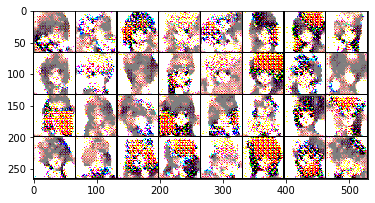

In [7]:
fix_noise=torch.randn(32,noise_size,1,1)
fix_noise=fix_noise.cuda()
generator.cuda()
fake_u=generator(fix_noise)
imgs = make_grid(fake_u.data*0.5+0.5).cpu() # CHW
plt.imshow(imgs.permute(1,2,0).numpy()) # HWC